# RFF Component Analysis

In [1]:
print("="*80)
print("IMPORTING UTILITIES")
print("="*80)

from src.Utils import *
from src.Executions import *
from src.Data import *
from src.Classifiers import *
from src.Plots import *
from src.Stat_tests import *

import os
import pandas as pd
import numpy as np
import multiprocessing
from joblib import Parallel, delayed


IMPORTING UTILITIES


/Users/federicoclerici/Documents/UPC/AML/Projects/Project 3/AML_PROJECT_3/src/Classifiers.py:114: SyntaxWarning: invalid escape sequence '\h'
  """


In [2]:
print("="*80)
print("SETTING UP VARIABLES FOR TESTING")
print("="*80)

os.makedirs('img', exist_ok=True)
D_VALUES = np.logspace(np.log10(1), np.log10(1500), 10).astype(int)
DIFFICULTIES = ['easy', 'medium', 'hard']
SEEDS = [42, 123, 456, 789, 1024, 2048, 4096, 8192, 
         271828, 314159, 161803, 999, 5555, 7777,
         12345, 54321, 13579, 24680, 87654, 11111]
N_JOBS = max(1, multiprocessing.cpu_count() - 1)
sizes = [1000, 2000, 3000, 4000, 5000]

SETTING UP VARIABLES FOR TESTING


### Experiments with syntetic Datasets

EASY EXAMPLE PAIR PLOT


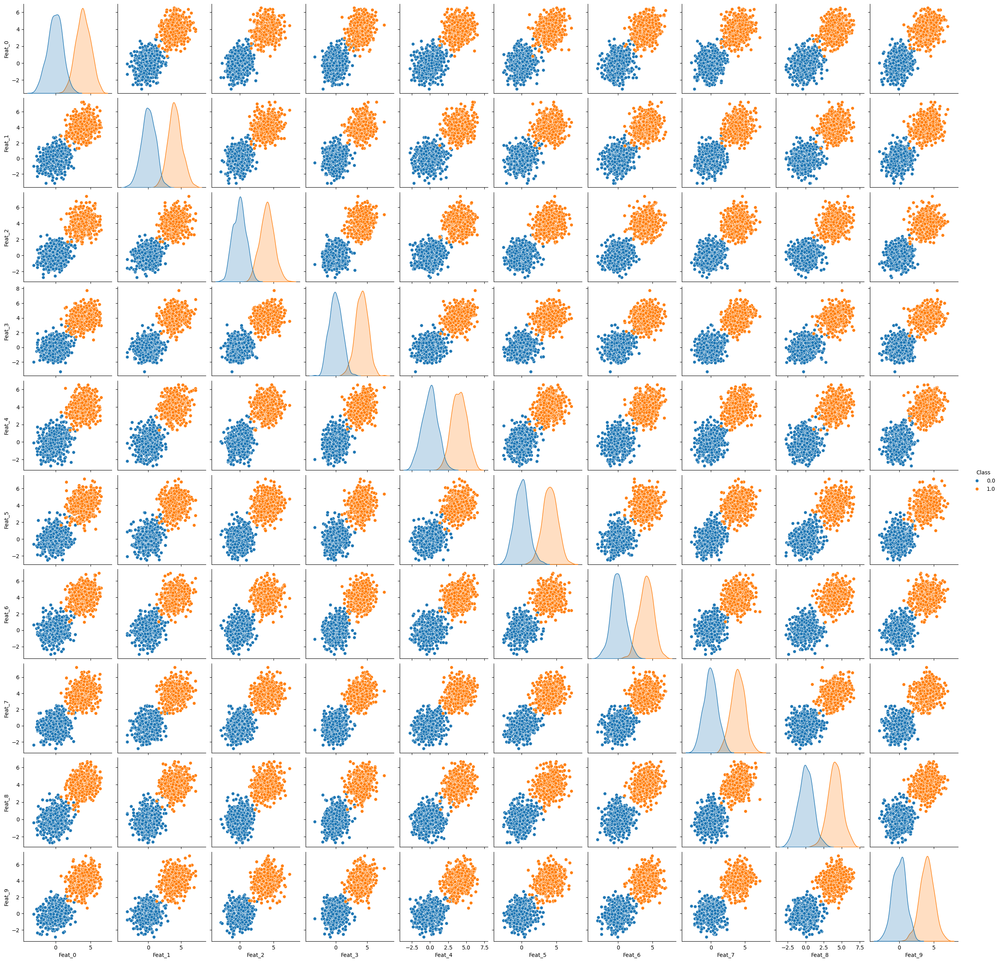

In [5]:
print("="*80)
print("EASY EXAMPLE PAIR PLOT")
print("="*80)

hardness_example('easy')

MEDIUM EXAMPLE PAIR PLOT


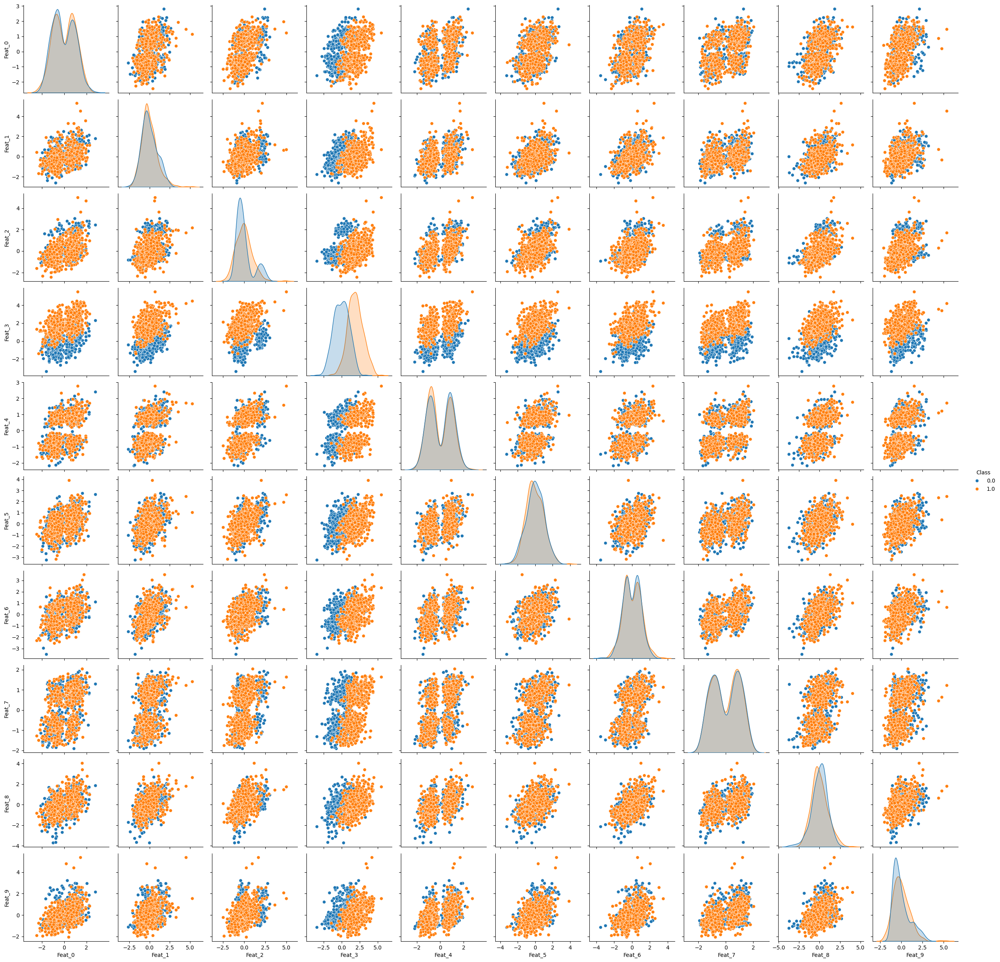

In [6]:
print("="*80)
print("MEDIUM EXAMPLE PAIR PLOT")
print("="*80)

hardness_example('medium')

HARD EXAMPLE PAIR PLOT


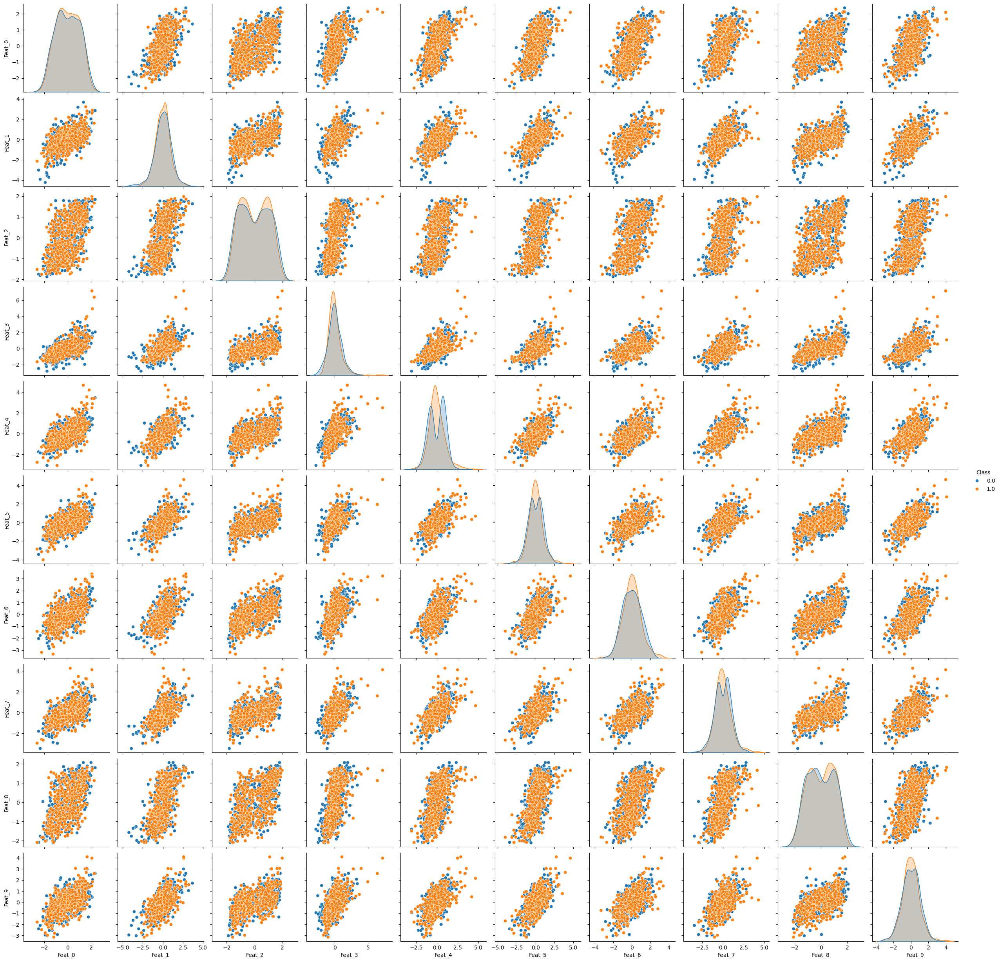

In [7]:
print("="*80)
print("HARD EXAMPLE PAIR PLOT")
print("="*80)

hardness_example('hard')

In [3]:
print("="*80)
print("TESTING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS")
print("="*80)
print(f"RFF Component Analysis: Testing {len(D_VALUES)} D values")
print(f"Difficulty levels: {len(DIFFICULTIES)}")
print(f"Different seeds: {len(SEEDS)}")
print(f"Total experiments: {len(DIFFICULTIES) * len(SEEDS)}")
print(f"Parallel workers: {N_JOBS}")
print(f"{'='*80}")

tasks = [(difficulty, seed, D_VALUES) 
         for difficulty in DIFFICULTIES 
         for seed in SEEDS
         for D_VALUE in D_VALUES]

print(f"\nProcessing {len(tasks)} total tasks in parallel:\n")

results_nested = Parallel(n_jobs=N_JOBS, verbose=10)(
    delayed(process_single_run)(difficulty, seed, D_VALUE) for difficulty, seed, D_VALUE in tasks
)

results = [item for sublist in results_nested for item in sublist]

TESTING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS
RFF Component Analysis: Testing 10 D values
Difficulty levels: 3
Different seeds: 20
Total experiments: 60
Parallel workers: 7

Processing 600 total tasks in parallel:



[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done   4 tasks      | elapsed:    8.8s
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:   14.7s
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:   20.5s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:   25.6s
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:   35.7s
[Parallel(n_jobs=7)]: Done  47 tasks      | elapsed:   41.3s
[Parallel(n_jobs=7)]: Done  58 tasks      | elapsed:   52.2s
[Parallel(n_jobs=7)]: Done  71 tasks      | elapsed:  1.1min
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:  1.2min
[Parallel(n_jobs=7)]: Done  99 tasks      | elapsed:  1.4min
[Parallel(n_jobs=7)]: Done 114 tasks      | elapsed:  1.6min
[Parallel(n_jobs=7)]: Done 131 tasks      | elapsed:  1.9min
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:  2.2min
[Parallel(n_jobs=7)]: Done 167 tasks      | elapsed:  2.4min
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:  2.7min
[Parallel(

In [ ]:
print("="*80)
print("PERFORMANCE COMPARISON TABLE (SYNTHETIC DATA)")
print("="*80)

# Convert results to DataFrame
df_results = pd.DataFrame(results)

# Split by difficulty
df_easy = df_results[df_results['Difficulty'] == 'easy']
df_medium = df_results[df_results['Difficulty'] == 'medium']
df_hard = df_results[df_results['Difficulty'] == 'hard']

# Generate table
comp_table = create_synthetic_performance_table(
    df_easy, 
    df_medium, 
    df_hard,
    D_VALUES=D_VALUES
)

VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS

Analysis for EASY Difficulty


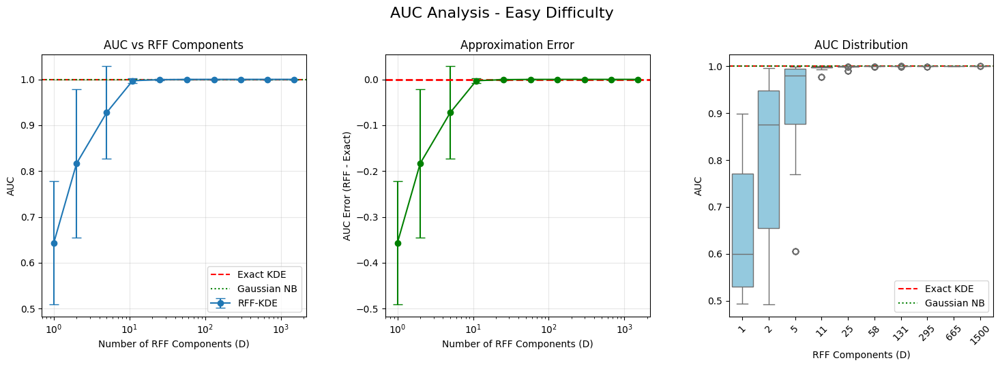

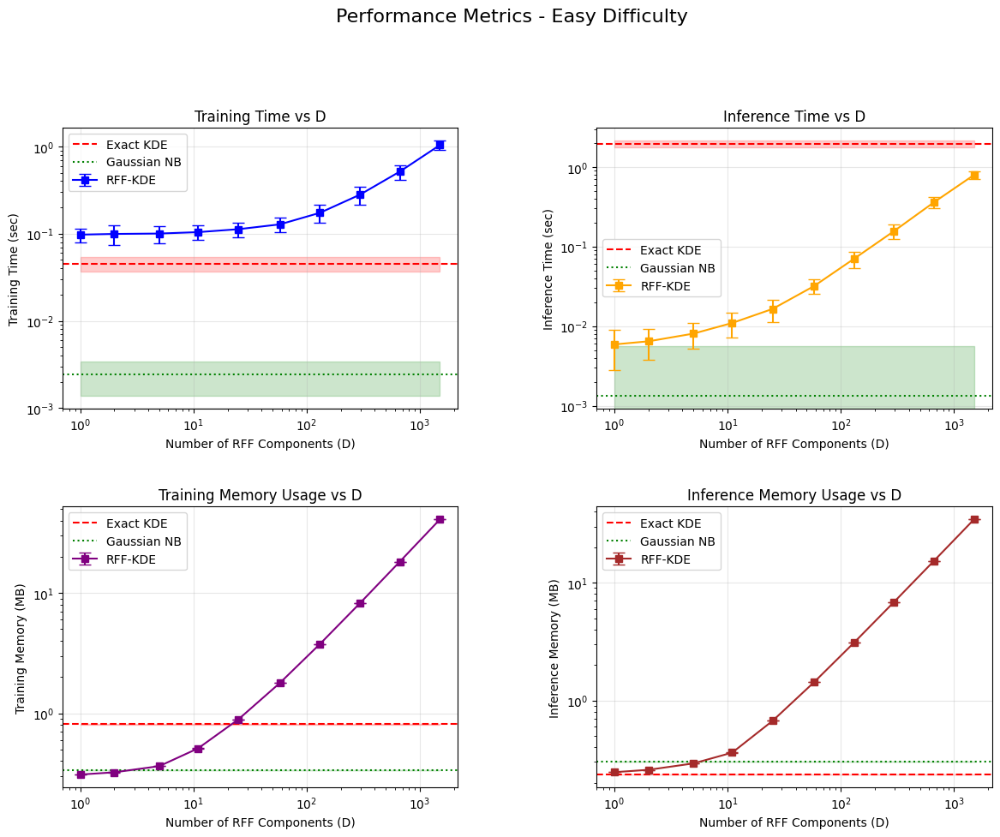


Analysis for MEDIUM Difficulty


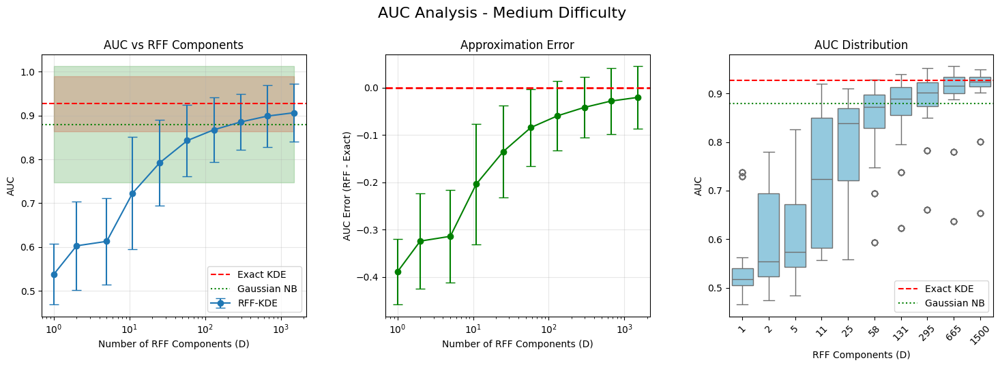

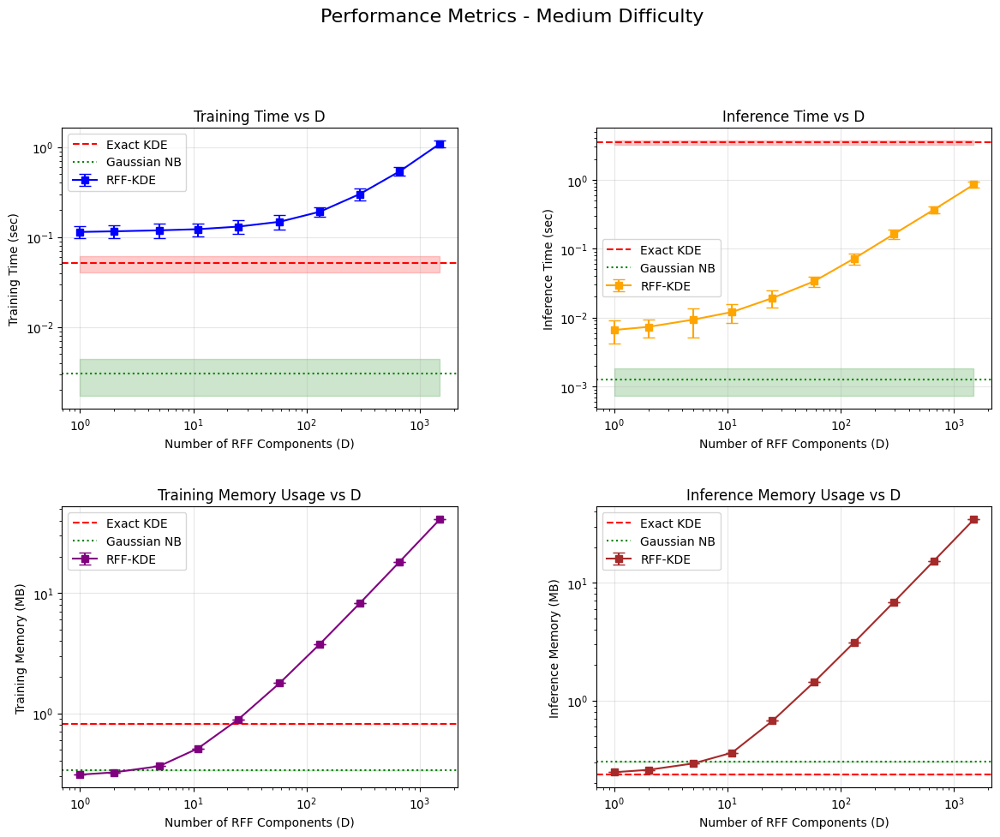


Analysis for HARD Difficulty


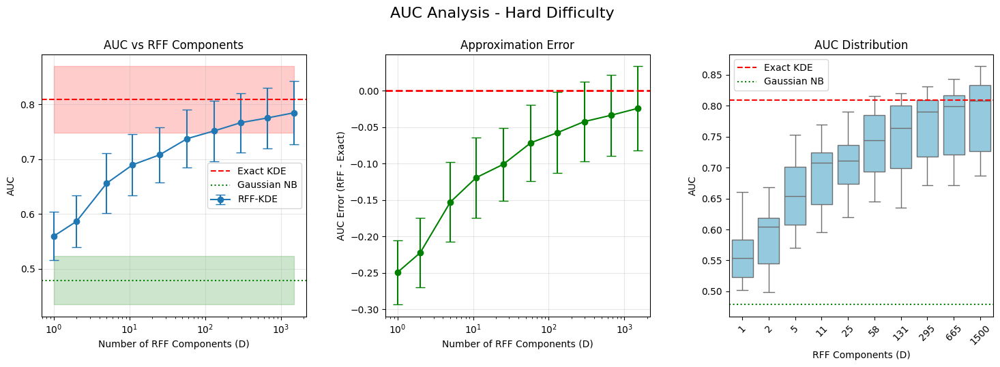

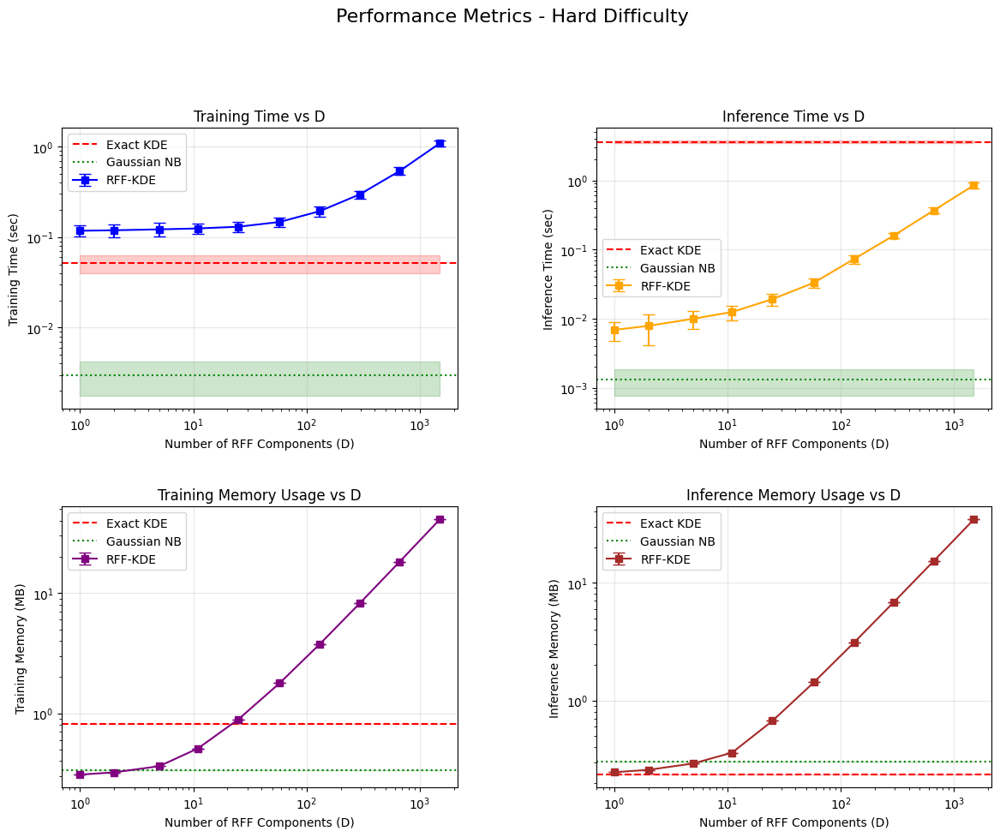

In [14]:
print("="*80)
print("VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS")
print("="*80)

df = pd.DataFrame(results)
plot_rff_comparative_analysis(df, D_VALUES, DIFFICULTIES)

### Test on real data

In [3]:
print("="*80)
print("IMPORTING AND PREPARING THE REAL DATASET")
print("="*80)
X, y = magic_gamma_data()
X, y = prepare_magic_gamma(X,y)
D_VALUES_REAL = np.logspace(np.log10(1), np.log10(len(X)//2), 10).astype(int)

IMPORTING AND PREPARING THE REAL DATASET


VISUALIZING THE REAL DATASET PAIR PLOT


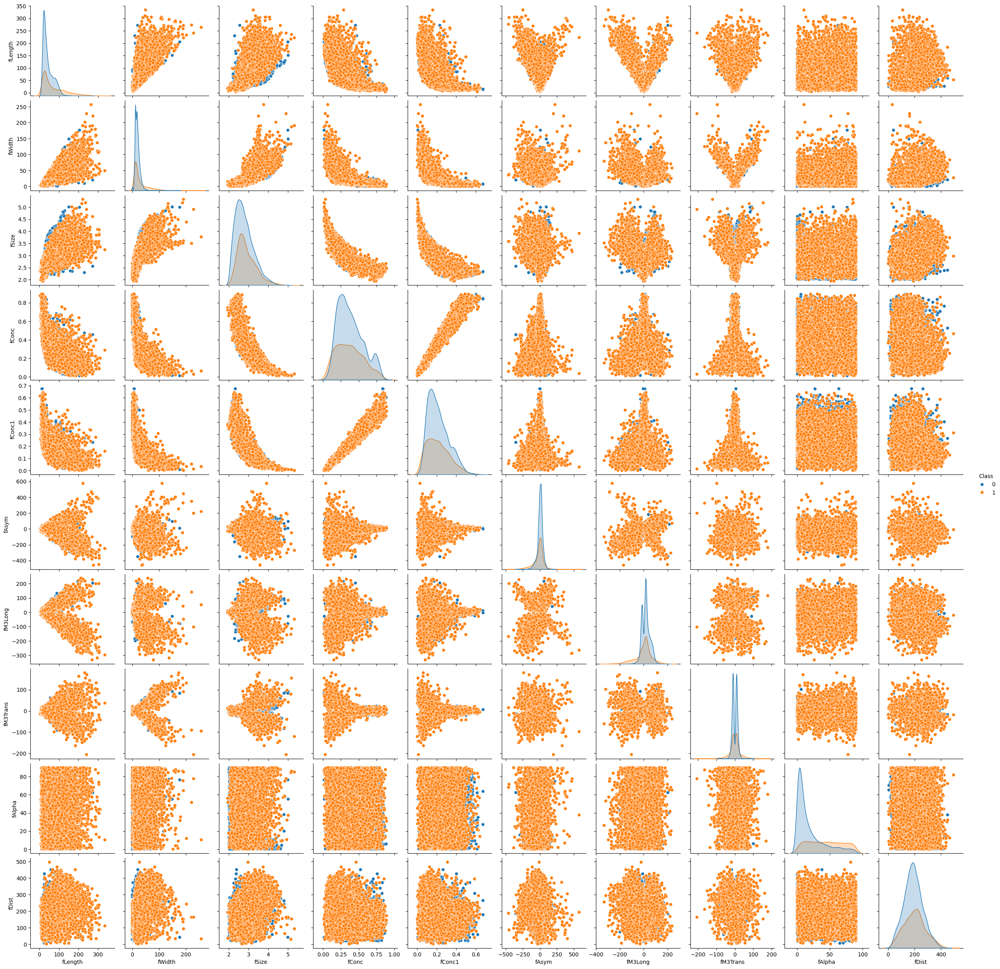

In [5]:
print("="*80)
print("VISUALIZING THE REAL DATASET PAIR PLOT")
print("="*80)
visualize_distribution(X, y)

VISUALIZING THE REAL DATASET FEATURE-TARGET CORRELATION


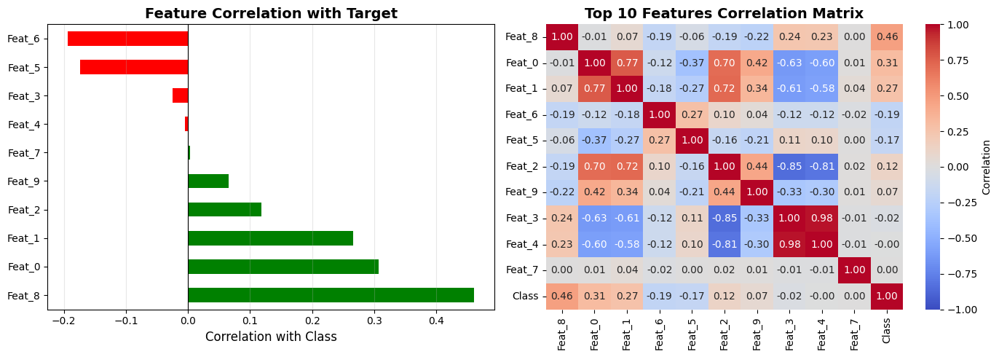


Feature-Target Correlation:
Feat_8    0.460979
Feat_0    0.307572
Feat_1    0.265596
Feat_2    0.117795
Feat_9    0.065203
Feat_7    0.003837
Feat_4   -0.004797
Feat_3   -0.024615
Feat_5   -0.173587
Feat_6   -0.193409
Name: Class, dtype: float64


In [5]:
print("="*80)
print("VISUALIZING THE REAL DATASET FEATURE-TARGET CORRELATION")
print("="*80)
plot_feature_target_correlation(X, y)

In [ ]:
print("="*80)
print("TESTING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS ON MAGIC GAMMA DATASET")
print("="*80)
print(f"Dataset size: {X.shape[0]} samples, {X.shape[1]} features")
print(f"RFF Component Analysis: Testing {len(D_VALUES_REAL)} D values")
print(f"Different seeds: {len(SEEDS)}")
print(f"Total experiments: {len(SEEDS) * len(D_VALUES_REAL)} (RFF) + {2 * len(SEEDS)} (baselines)")
print(f"Parallel workers: {N_JOBS}")
print(f"{'='*80}")

# Create tasks: add flag to compute baselines only for the first D of each seed
tasks_magic = []
for seed in SEEDS:
    for i, D_VALUE in enumerate(D_VALUES_REAL):
        compute_baselines = (i == 0)
        tasks_magic.append((seed, D_VALUE, compute_baselines))

print(f"\nProcessing {len(tasks_magic)} total tasks in parallel:\n")

results_nested_magic = Parallel(n_jobs=N_JOBS, verbose=10)(
    delayed(process_single_run_real)(X, y, seed, D_VALUE, compute_baselines) 
    for seed, D_VALUE, compute_baselines in tasks_magic
)

results_magic = [item for sublist in results_nested_magic for item in sublist]

TESTING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS ON MAGIC GAMMA DATASET
Dataset size: 19020 samples, 10 features
RFF Component Analysis: Testing 10 D values
Different seeds: 20
Total experiments: 200 (RFF) + 40 (baselines)
Parallel workers: 7

Processing 200 total tasks in parallel:



[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done   4 tasks      | elapsed:    4.2s
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    6.6s
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:   25.4s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:   49.3s
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:  1.1min
[Parallel(n_jobs=7)]: Done  47 tasks      | elapsed:  1.6min
[Parallel(n_jobs=7)]: Done  58 tasks      | elapsed:  1.8min
[Parallel(n_jobs=7)]: Done  71 tasks      | elapsed:  2.2min
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:  2.9min
[Parallel(n_jobs=7)]: Done  99 tasks      | elapsed:  3.5min
[Parallel(n_jobs=7)]: Done 114 tasks      | elapsed:  4.2min
[Parallel(n_jobs=7)]: Done 131 tasks      | elapsed:  4.8min
[Parallel(n_jobs=7)]: Done 148 tasks      | elapsed:  6.1min
[Parallel(n_jobs=7)]: Done 167 tasks      | elapsed:  7.4min
[Parallel(n_jobs=7)]: Done 186 tasks      | elapsed:  8.5min
[Parallel(


✅ Benchmark complete


VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS ON MAGIC GAMMA DATASET


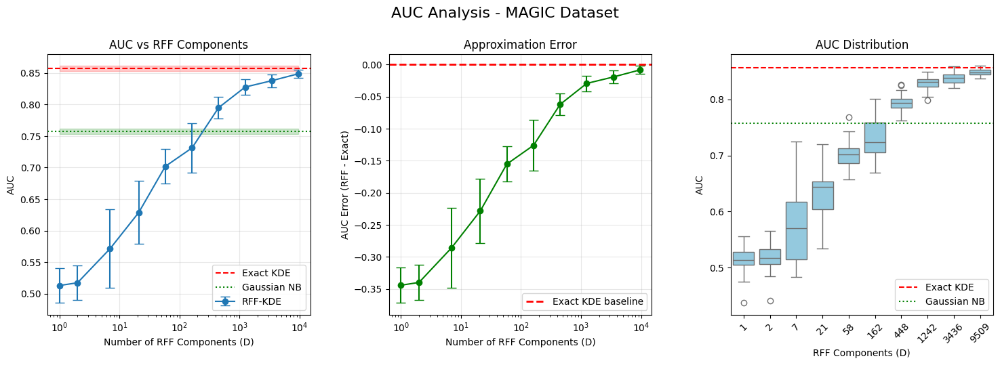

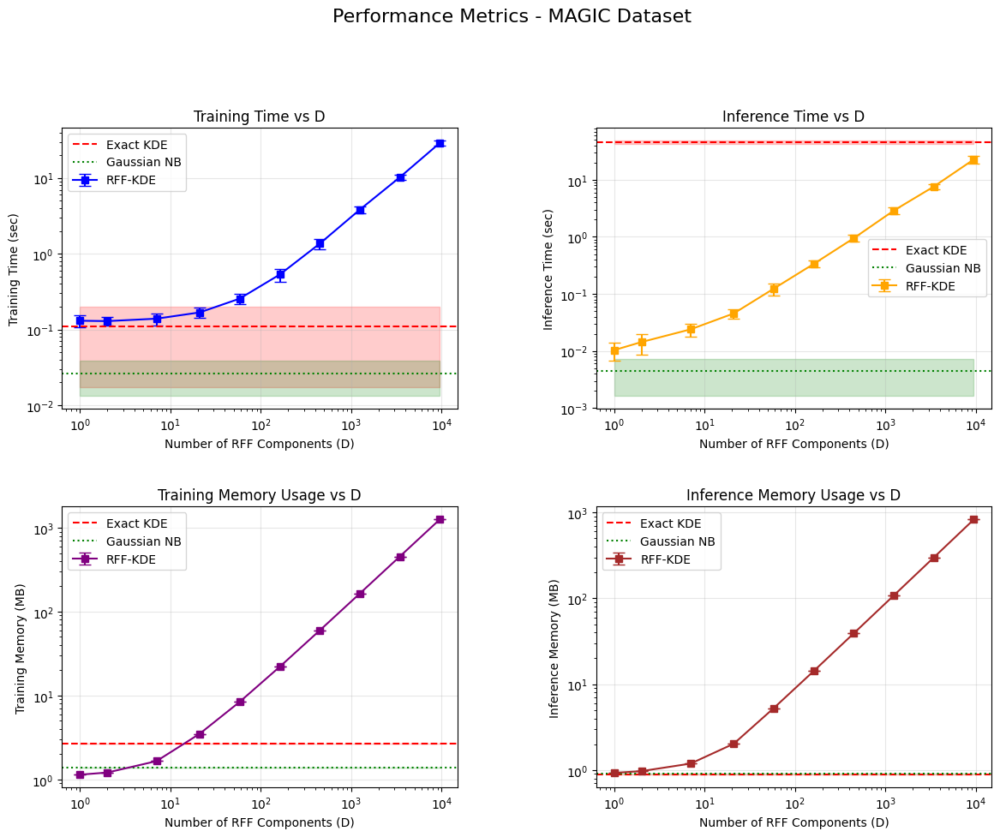

In [9]:
print("="*80)
print("VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE SETTINGS ON MAGIC GAMMA DATASET")
print("="*80)

df_magic = pd.DataFrame(results_magic)
plot_rff_comparative_analysis_magic(df_magic, D_VALUES_REAL)

In [ ]:
print("="*80)
print("PERFORMANCE COMPARISON TABLE (MAGIC DATASET)")
print("="*80)

# Convert MAGIC results to DataFrame
df_magic = pd.DataFrame(results_magic)  # Assuming you have 'magic_results' variable

# Generate MAGIC performance table
magic_table = create_magic_performance_table(
    df_magic=df_magic,
    D_VALUES=D_VALUES_REAL,
    output_path='results/magic_performance_comparison.csv'
)

# Display the formatted table
print("\nFormatted Performance Table (MAGIC Dataset):")
print(magic_table.to_string(index=False))

print("\n" + "="*80)
print("Raw data (mean and std separated) saved to: results/magic_performance_comparison.csv")
print("="*80)

PERFORMANCE COMPARISON TABLE (MAGIC DATASET)
MAGIC performance table saved to: results/magic_performance_comparison.csv

Formatted Performance Table (MAGIC Dataset):
          Method           MAGIC
     Gaussian NB 0.7574 ± 0.0045
       Exact KDE 0.8572 ± 0.0041
   RFF-KDE (D=1) 0.5129 ± 0.0277
   RFF-KDE (D=2) 0.5172 ± 0.0274
   RFF-KDE (D=7) 0.5715 ± 0.0625
  RFF-KDE (D=21) 0.6289 ± 0.0501
  RFF-KDE (D=58) 0.7019 ± 0.0274
 RFF-KDE (D=162) 0.7313 ± 0.0392
 RFF-KDE (D=448) 0.7950 ± 0.0168
RFF-KDE (D=1242) 0.8278 ± 0.0120
RFF-KDE (D=3436) 0.8378 ± 0.0101
RFF-KDE (D=9509) 0.8488 ± 0.0063

Raw data (mean and std separated) saved to: results/magic_performance_comparison.csv


## Complexity check for the RFF

In [5]:
print("="*80)
print("STARTING THE SCALING TESTS")
print("="*80)
print(f"Scaling Analysis: Testing {len(sizes)} dataset sizes")
print(f"Different seeds: {len(SEEDS)}")
print(f"Total experiments: {len(sizes) * len(SEEDS)}")
print(f"Parallel workers: {N_JOBS}")
print("="*80)

# Create all combinations of (size, seed)
tasks_scaling = [(size, seed) for size in sizes for seed in SEEDS]

print(f"\nProcessing {len(tasks_scaling)} total tasks in parallel:")

# Execute in parallel
results_scaling_nested = Parallel(n_jobs=N_JOBS, verbose=10)(
    delayed(process_size_run)(size, seed) for size, seed in tasks_scaling
)

# Flatten results
results_scaling = [item for sublist in results_scaling_nested for item in sublist]

print("\n\nScaling benchmark complete")

STARTING THE SCALING TESTS
Scaling Analysis: Testing 5 dataset sizes
Different seeds: 20
Total experiments: 100
Parallel workers: 7

Processing 100 total tasks in parallel:


[Parallel(n_jobs=7)]: Using backend LokyBackend with 7 concurrent workers.
[Parallel(n_jobs=7)]: Done   4 tasks      | elapsed:    0.3s
[Parallel(n_jobs=7)]: Done  11 tasks      | elapsed:    0.6s
[Parallel(n_jobs=7)]: Done  18 tasks      | elapsed:    0.9s
[Parallel(n_jobs=7)]: Done  27 tasks      | elapsed:    1.6s
[Parallel(n_jobs=7)]: Done  36 tasks      | elapsed:    2.7s
[Parallel(n_jobs=7)]: Done  47 tasks      | elapsed:    3.9s
[Parallel(n_jobs=7)]: Done  58 tasks      | elapsed:    6.0s
[Parallel(n_jobs=7)]: Done  71 tasks      | elapsed:   10.0s
[Parallel(n_jobs=7)]: Done  84 tasks      | elapsed:   15.0s




Scaling benchmark complete


[Parallel(n_jobs=7)]: Done  98 out of 100 | elapsed:   20.2s remaining:    0.4s
[Parallel(n_jobs=7)]: Done 100 out of 100 | elapsed:   20.3s finished


VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE DATASET SIZES FOR THE SCALING TEST
✓ Saved: img/rff_comparative_analysis_scaling.png


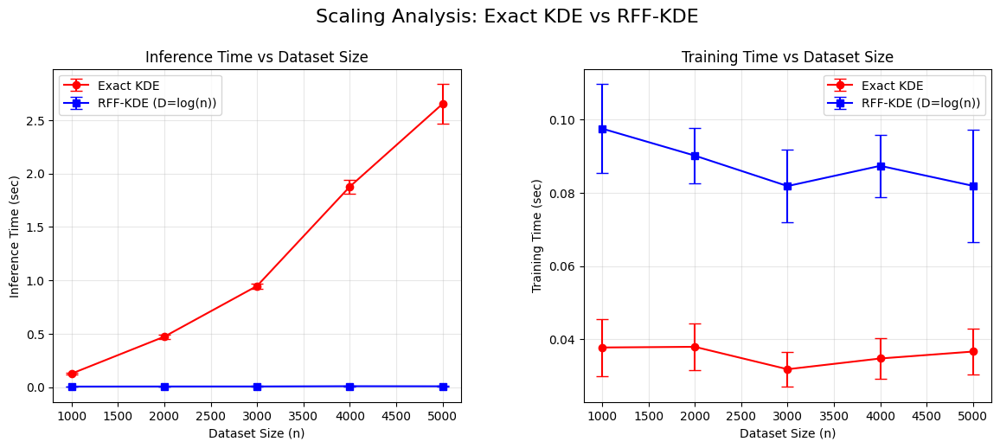

In [6]:
print("="*80)
print("VISUALIZING RFF COMPONENT ANALYSIS ACROSS MULTIPLE DATASET SIZES FOR THE SCALING TEST")
print("="*80)
plot_rff_comparative_analysis_scaling(results_scaling)

In [11]:
print("\n" + "="*80)
print("SCALING SUMMARY: Exact KDE vs RFF-KDE")
print("="*80)
scaling_summary_table(results_scaling, sizes)


SCALING SUMMARY: Exact KDE vs RFF-KDE
 Size  D  KDE_Train_Time  RFF_Train_Time  KDE_Infer_Time  RFF_Infer_Time  Train_Speedup  Infer_Speedup  KDE_AUC  RFF_AUC  AUC_Diff
 1000  6          0.0380          0.0841          0.1178          0.0061         0.4517        19.3375   0.9010   0.6770   -0.2240
 2000  7          0.0335          0.0639          0.4285          0.0053         0.5241        81.0151   0.9129   0.7262   -0.1867
 3000  8          0.0313          0.0673          0.8906          0.0083         0.4651       107.1065   0.8815   0.6712   -0.2104
 4000  8          0.0353          0.0628          1.6801          0.0068         0.5622       245.5087   0.9212   0.6864   -0.2348
 5000  8          0.0360          0.0627          2.5107          0.0076         0.5741       330.3675   0.9277   0.6867   -0.2410

INTERPRETATION
As dataset size increases from 1000 to 5000:
- RFF-KDE uses D=log(n) features, ranging from 6 to 8
- Training speedup ranges from 0.45x to 0.57x
- Inference sp

## Statistical tests
At what minimum D does RFF-KDE not significantly differ from Exact KDE?

With 2% difference

In [5]:
print("="*80)
print("STATISTICAL EQUIVALENCE TESTING FOR RFF-KDE RESULTS WITH DETAILED DIAGNOSTICS")
print("="*80)

df_results = pd.DataFrame(results)

# AUTO MODE: Chooses parametric or bootstrap based on normality
stratified_results = equivalence_test_rff_kde(
        df_results,
        D_VALUES,
        equivalence_margin=0.02,
        alpha=0.05,
        method='boostrap',            
        check_assumptions=True,
        save_diagnostics=False,
        n_bootstrap=10000
)

# Print summary
print_summary_table(stratified_results)

STATISTICAL EQUIVALENCE TESTING FOR RFF-KDE RESULTS WITH DETAILED DIAGNOSTICS

 TOST EQUIVALENCE TESTING: RFF vs EXACT KDE
Equivalence margin: ±0.0200 AUC
Method selection: boostrap

DIFFICULTY: EASY
  ⚠️  D=1: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=2: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=5: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=11: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=25: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=58: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=131: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=295: Non-normal differences (Shapiro p=0.0000)


/Users/federicoclerici/.pyenv/versions/3.12.2/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


  ⚠️  D=1500: Non-normal differences (Shapiro p=0.0000)
D        Mean Δ     SE        p(equiv)    Adj.p       90% CI                   Cohen d   Method      Decision
--------------------------------------------------------------------------------------------------------------
1        0.356247   0.009552  1.000000    1.000000    [0.34028, 0.37209]       2.637     Bootstrap   NOT equiv not norm
2        0.183229   0.011408  1.000000    1.000000    [0.16444, 0.20210]       1.136     Bootstrap   NOT equiv not norm
5        0.072270   0.007115  1.000000    1.000000    [0.06027, 0.08411]       0.718     Bootstrap   NOT equiv not norm
11       0.002926   0.000353  0.000000    0.000000    [0.00237, 0.00352]       0.586     Bootstrap   EQUIV not norm
25       0.000555   0.000153  0.000000    0.000000    [0.00031, 0.00081]       0.257     Bootstrap   EQUIV not norm
58       0.000100   0.000022  0.000000    0.000000    [0.00006, 0.00014]       0.326     Bootstrap   EQUIV not norm
131      0.0000

With 5% difference

In [6]:
print("="*80)
print("STATISTICAL EQUIVALENCE TESTING FOR RFF-KDE RESULTS WITH DETAILED DIAGNOSTICS")
print("="*80)

df_results = pd.DataFrame(results)

# AUTO MODE: Chooses parametric or bootstrap based on normality
stratified_results = equivalence_test_rff_kde(
        df_results,
        D_VALUES,
        equivalence_margin=0.05,
        alpha=0.05,
        method='boostrap',            
        check_assumptions=True,
        save_diagnostics=False,
        n_bootstrap=10000
)

# Print summary
print_summary_table(stratified_results)

STATISTICAL EQUIVALENCE TESTING FOR RFF-KDE RESULTS WITH DETAILED DIAGNOSTICS

 TOST EQUIVALENCE TESTING: RFF vs EXACT KDE
Equivalence margin: ±0.0500 AUC
Method selection: boostrap

DIFFICULTY: EASY
  ⚠️  D=1: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=2: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=5: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=11: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=25: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=58: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=131: Non-normal differences (Shapiro p=0.0000)
  ⚠️  D=295: Non-normal differences (Shapiro p=0.0000)


/Users/federicoclerici/.pyenv/versions/3.12.2/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:579: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)


  ⚠️  D=1500: Non-normal differences (Shapiro p=0.0000)
D        Mean Δ     SE        p(equiv)    Adj.p       90% CI                   Cohen d   Method      Decision
--------------------------------------------------------------------------------------------------------------
1        0.356247   0.009552  1.000000    1.000000    [0.34028, 0.37209]       2.637     Bootstrap   NOT equiv not norm
2        0.183229   0.011408  1.000000    1.000000    [0.16444, 0.20210]       1.136     Bootstrap   NOT equiv not norm
5        0.072270   0.007115  0.998700    1.000000    [0.06027, 0.08411]       0.718     Bootstrap   NOT equiv not norm
11       0.002926   0.000353  0.000000    0.000000    [0.00237, 0.00352]       0.586     Bootstrap   EQUIV not norm
25       0.000555   0.000153  0.000000    0.000000    [0.00031, 0.00081]       0.257     Bootstrap   EQUIV not norm
58       0.000100   0.000022  0.000000    0.000000    [0.00006, 0.00014]       0.326     Bootstrap   EQUIV not norm
131      0.0000